In [1]:
import numpy as np
import scipy
import scipy.io
import matplotlib.pyplot as plt


# Load the vivo dataset
vivo_path = 'exp/datasets/anes_data/vivo/data.mat'
vivo_data = scipy.io.loadmat(vivo_path)

# Extract keys and their shapes
vivo_summary = {k: v.shape for k, v in vivo_data.items() if isinstance(v, np.ndarray)}
vivo_summary


{'PSF_estim': (21, 11), 'bmode': (401, 200), 'rf': (401, 200)}

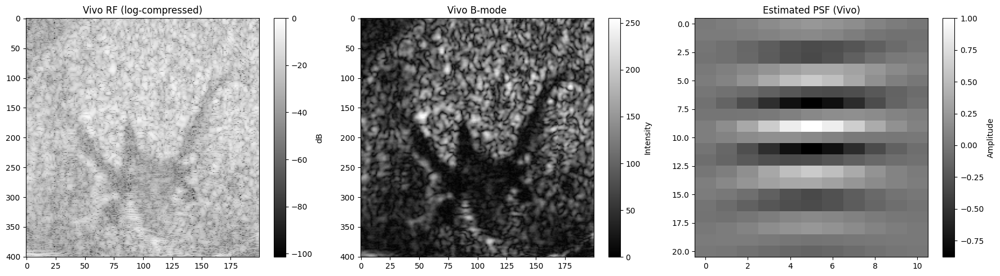

In [2]:
# Extract the data arrays
rf_vivo = vivo_data["rf"]
bmode_vivo = vivo_data["bmode"]
psf_vivo = vivo_data["PSF_estim"]

# Plot all three side-by-side
plt.figure(figsize=(18, 5))

# Plot RF (log-compressed)
plt.subplot(1, 3, 1)
rf_log = 20 * np.log10(np.abs(rf_vivo) / np.max(np.abs(rf_vivo)) + 1e-6)
plt.imshow(rf_log, cmap='gray', aspect='auto')
plt.title("Vivo RF (log-compressed)")
plt.colorbar(label='dB')

# Plot B-mode
plt.subplot(1, 3, 2)
plt.imshow(bmode_vivo, cmap='gray', aspect='auto')
plt.title("Vivo B-mode")
plt.colorbar(label='Intensity')

# Plot PSF
plt.subplot(1, 3, 3)
plt.imshow(psf_vivo, cmap='gray', aspect='auto')
plt.title("Estimated PSF (Vivo)")
plt.colorbar(label='Amplitude')

plt.tight_layout()
plt.show()


In [3]:
# === 1. Imports ===
import numpy as np
import scipy.io
import matplotlib.pyplot as plt
from numpy.fft import fft2, ifft2
from scipy.signal import hilbert
from skimage.metrics import peak_signal_noise_ratio, structural_similarity
from skimage.exposure import match_histograms

# === 4. RF-to-B-mode conversion ===
def rf_to_matched_bmode(RF: np.ndarray, ref_bmode: np.ndarray, increase: float = 1e-6) -> np.ndarray:
    env = np.abs(hilbert(RF, axis=0))
    db = 20.0 * np.log10(env + increase)
    db = np.clip(db, a_min=-60, a_max=None)
    db -= db.min()
    db *= (255.0 / db.max())
    ref = ref_bmode[:, :, 0] if ref_bmode.ndim == 3 else ref_bmode
    matched = match_histograms(db, ref, channel_axis=None)
    return np.clip(matched, 0, 255).astype(np.uint8)


In [4]:
def normalize_rf(rf: np.ndarray, min_val: float = -1.0, max_val: float = 1.0) -> np.ndarray:
    """
    Normalize RF data to a specified range [min_val, max_val].

    Parameters:
        rf (np.ndarray): Input RF data.
        min_val (float): Minimum value of the target range (default: -1.0).
        max_val (float): Maximum value of the target range (default: 1.0).

    Returns:
        np.ndarray: Normalized RF data.
    """
    rf_min, rf_max = rf.min(), rf.max()
    norm = (rf - rf_min) / (rf_max - rf_min + 1e-8)  # avoid division by zero
    scaled = norm * (max_val - min_val) + min_val
    return scaled


In [5]:
import numpy as np

def resize_rf_to_512(input_rf):
    """
    Resize 401x200 RF to 512x512 using symmetry-based padding for DDRM.
    """
    H, W = input_rf.shape
    assert H == 401 and W == 200, "Expected shape (401, 200)"

    # Initialize 512x512 array
    data = np.zeros((512, 512), dtype=input_rf.dtype)

    # 1. Original
    data[0:401, 0:200] = input_rf

    # 2. Horizontal flip
    data[0:401, 200:400] = np.fliplr(input_rf)

    # 3. Horizontal extension
    data[0:401, 400:] = input_rf[:, :112]

    # 4. Vertical flip
    temp = data[290:401, :]    # MATLAB's 291:401 → Python's 290:401
    data[401:, :] = np.flipud(temp)

    return data



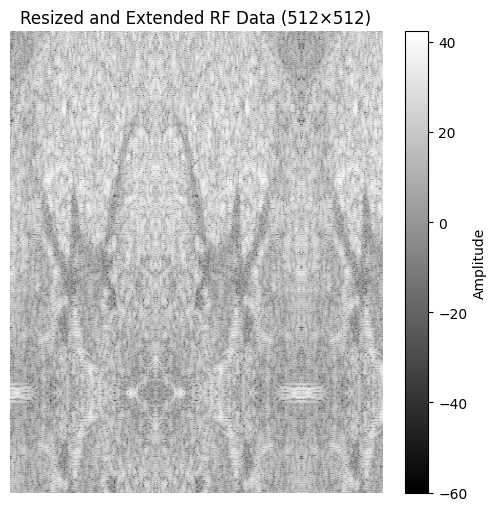

In [13]:
import numpy as np
import scipy.io
import matplotlib.pyplot as plt

# Load the .mat file (adjust the path as needed)
mat_path = "exp/datasets/anes_data/vivo/data.mat"
data = scipy.io.loadmat(mat_path)

# Extract RF data (shape should be [401, 200])
rf = data['rf']

# --- MATLAB-style resizing and mirroring ---
data2 = rf.copy()  # (401, 200)
result = np.zeros((512, 512), dtype=rf.dtype)

# Fill left: original RF
result[:401, :200] = data2

# Fill middle: horizontally flipped RF
result[:401, 200:400] = np.fliplr(data2)

# Fill right: first 112 columns of RF
result[:401, 400:] = data2[:, :112]

# Bottom rows: mirror flip of rows 291:401
temp = result[290:401, :]
result[401:, :] = np.flipud(temp)

# --- Visualize in log-compressed scale ---
plt.figure(figsize=(6, 6))
plt.imshow(20 * np.log10(np.abs(result) + 1e-6), cmap='gray', aspect='auto')
plt.title("Resized and Extended RF Data (512×512)")
plt.colorbar(label='Amplitude')
plt.axis('off')
plt.show()


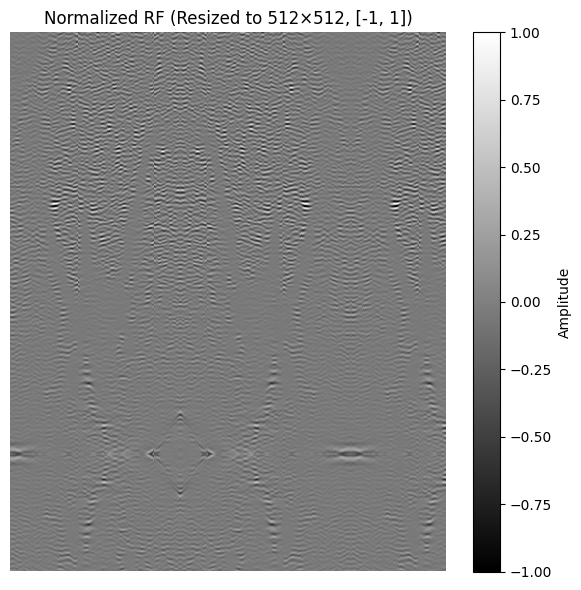

In [14]:
import numpy as np
import scipy.io
import matplotlib.pyplot as plt

# Load the .mat file
mat_path = "exp/datasets/anes_data/vivo/data.mat"
data = scipy.io.loadmat(mat_path)

# Extract RF data
rf = data['rf']  # shape: (401, 200)

# --- MATLAB-style resizing and mirroring ---
data2 = rf.copy()
result = np.zeros((512, 512), dtype=rf.dtype)

# Fill left: original RF
result[:401, :200] = data2

# Fill middle: horizontally flipped RF
result[:401, 200:400] = np.fliplr(data2)

# Fill right: first 112 columns of RF
result[:401, 400:] = data2[:, :112]

# Bottom rows: mirror flip of rows 291:401
temp = result[290:401, :]
result[401:, :] = np.flipud(temp)

# --- Normalize to [-1, 1] ---
rf_min, rf_max = result.min(), result.max()
result_norm = 2 * ((result - rf_min) / (rf_max - rf_min + 1e-8)) - 1

# --- Visualize log-compressed normalized RF ---
plt.figure(figsize=(6, 6))
plt.imshow(result_norm, cmap='gray', aspect='auto')
plt.title("Normalized RF (Resized to 512×512, [-1, 1])")
plt.axis('off')
plt.colorbar(label='Amplitude')
plt.tight_layout()
plt.show()


In [15]:
from scipy.io import savemat

savemat("vivo/normalized_rf.mat",
        {"rf_degraded": result_norm.astype(np.float32)})
print("Saved normalized RF to vivo/normalized_rf.mat")


Saved normalized RF to vivo/normalized_rf.mat


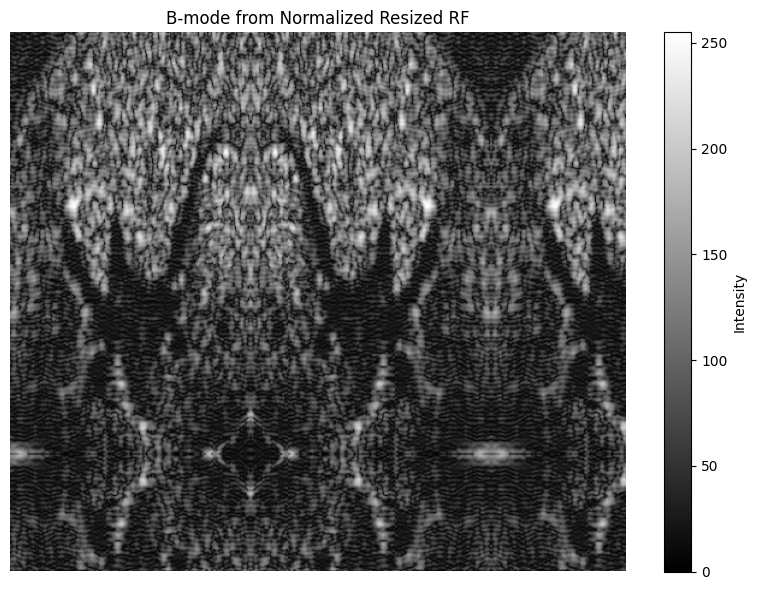

In [16]:
def rf_to_matched_bmode(RF: np.ndarray, ref_bmode: np.ndarray, increase: float = 1e-6) -> np.ndarray:
    env = np.abs(hilbert(RF, axis=0))
    db = 20.0 * np.log10(env + increase)
    db = np.clip(db, a_min=-60, a_max=None)
    db -= db.min()
    db *= (255.0 / db.max())
    ref = ref_bmode[:, :, 0] if ref_bmode.ndim == 3 else ref_bmode
    matched = match_histograms(db, ref, channel_axis=None)
    return np.clip(matched, 0, 255).astype(np.uint8)
    
# Apply conversion
bmode_resized = rf_to_matched_bmode(result_norm, bmode_vivo)

# --- Visualize the B-mode ---
plt.figure(figsize=(8, 6))
plt.imshow(bmode_resized, cmap='gray', aspect='auto')
plt.title("B-mode from Normalized Resized RF")
plt.axis('off')
plt.colorbar(label='Intensity')
plt.tight_layout()
plt.show()


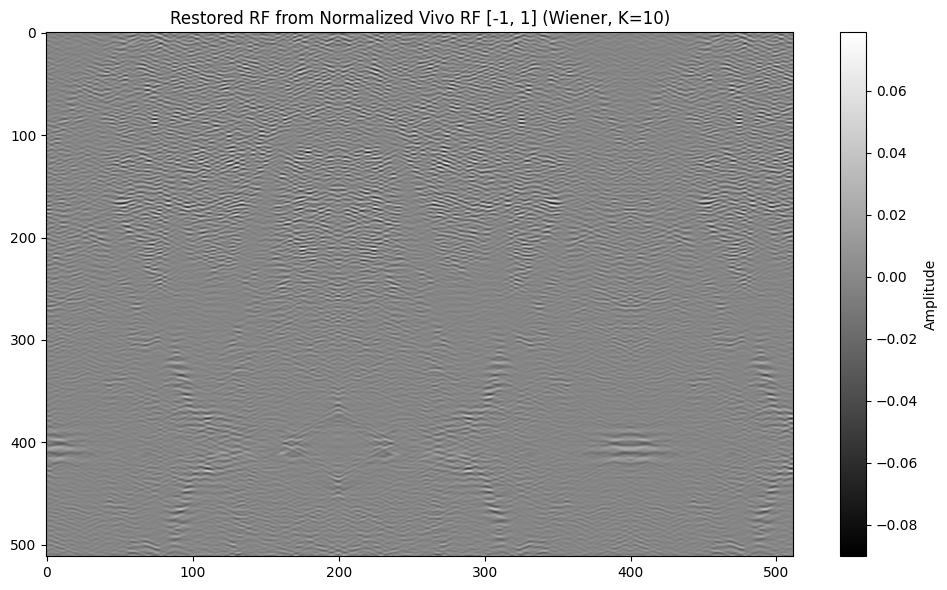

In [17]:
# Define and run Wiener deconvolution with K = 8 on normalized RF
def wiener_deconvolution(y: np.ndarray, psf: np.ndarray, K: float = 0.01) -> np.ndarray:
    H, W = y.shape
    Mh, Nh = psf.shape

    # Zero-pad and center PSF
    padded = np.zeros((H, W), dtype=np.float32)
    padded[:Mh, :Nh] = psf
    center = (Mh // 2, Nh // 2)
    shifted = np.roll(np.roll(padded, -center[0], axis=0), -center[1], axis=1)

    # FFTs
    H_fft = np.fft.fft2(shifted)
    Y_fft = np.fft.fft2(y)

    # Wiener filter
    H_conj = np.conj(H_fft)
    H_abs2 = np.abs(H_fft) ** 2
    X_hat = (H_conj / (H_abs2 + K)) * Y_fft

    # Inverse FFT
    x_restored = np.real(np.fft.ifft2(X_hat))
    return x_restored

# Apply Wiener deconvolution with K = 8
restored_rf_vivo_norm_wiener = wiener_deconvolution(result_norm, psf_vivo, K=10)

# Visualize the restored RF
plt.figure(figsize=(10, 6))
plt.imshow(restored_rf_vivo_norm_wiener, cmap='gray', aspect='auto')
plt.title("Restored RF from Normalized Vivo RF [-1, 1] (Wiener, K=10)")
plt.colorbar(label='Amplitude')
plt.tight_layout()
plt.show()


In [28]:
from skimage.metrics import peak_signal_noise_ratio, structural_similarity



psnr = peak_signal_noise_ratio(result_norm, restored_rf_vivo_norm_wiener, data_range=2.0)


print(f"PSNR: {psnr:.2f} dB")


PSNR: 22.94 dB


In [18]:
import numpy as np
import scipy.io

# 1) Load your surrogate GT RF
gt_mat = scipy.io.loadmat("vivo/rf_GT_norm_512.mat")
gt_key = [k for k in gt_mat if not k.startswith("__")][0]
rf_gt  = gt_mat[gt_key].astype(np.float32)

# 2) Compute its min and max
m, M = rf_gt.min(), rf_gt.max()
print(f"Original GT range: [{m:.4f}, {M:.4f}]")

# 3) Rescale to [-1, 1]
rf_gt_scaled = 2 * (rf_gt - m) / (M - m + 1e-8) - 1

# 4) Verify new range
print(f"New GT range: [{rf_gt_scaled.min():.4f}, {rf_gt_scaled.max():.4f}]")

# 5) Save back under the key your DDRM script expects, e.g. "GT_rf_resized"
scipy.io.savemat("vivo/rf_GT_norm_512_scaled.mat",
                 {"GT_rf_resized": rf_gt_scaled})
print("Saved scaled GT RF to vivo/rf_GT_norm_512_scaled.mat")


Original GT range: [-0.0902, 0.0789]
New GT range: [-1.0000, 1.0000]
Saved scaled GT RF to vivo/rf_GT_norm_512_scaled.mat


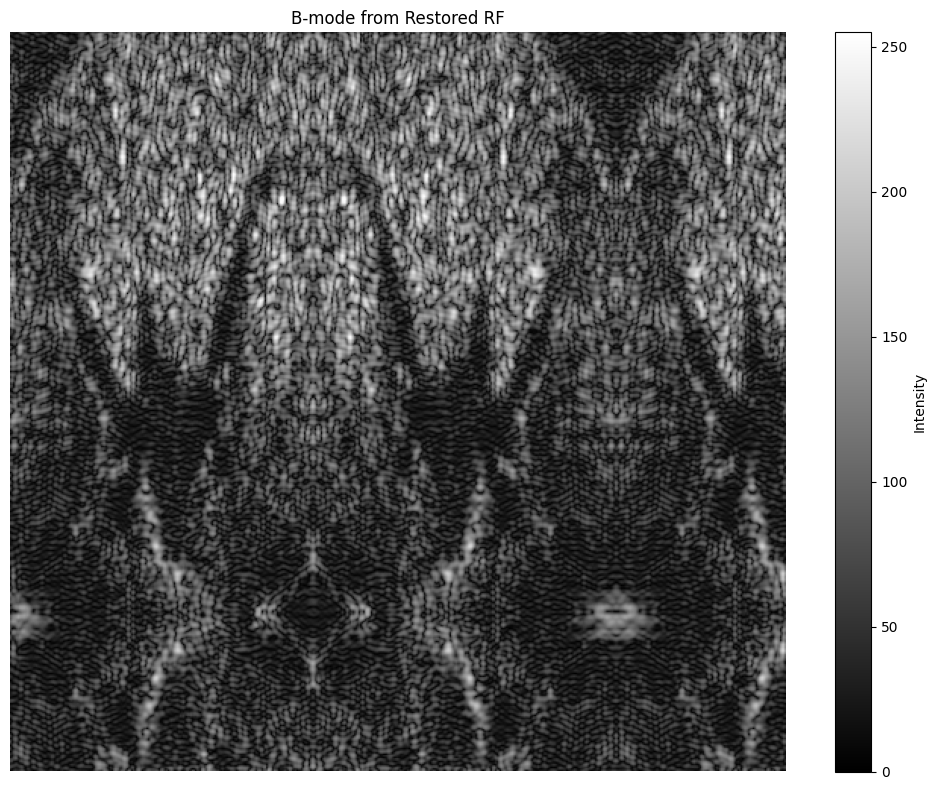

In [19]:
def rf_to_matched_bmode(RF: np.ndarray, ref_bmode: np.ndarray, increase: float = 1e-6) -> np.ndarray:
    env = np.abs(hilbert(RF, axis=0))
    db = 20.0 * np.log10(env + increase)
    db = np.clip(db, a_min=-60, a_max=None)
    db -= db.min()
    db *= (255.0 / db.max())
    ref = ref_bmode[:, :, 0] if ref_bmode.ndim == 3 else ref_bmode
    matched = match_histograms(db, ref, channel_axis=None)
    return np.clip(matched, 0, 255).astype(np.uint8)
    
# Apply conversion
bmode_resized = rf_to_matched_bmode(rf_gt_scaled, bmode_vivo)

# --- Visualize the B-mode ---
plt.figure(figsize=(10, 8))
plt.imshow(bmode_resized, cmap='gray', aspect='auto')
plt.title("B-mode from Restored RF")
plt.axis('off')
plt.colorbar(label='Intensity')
plt.tight_layout()
plt.show()


In [20]:
import scipy.io

# Load the uploaded DDRM input and surrogate GT
degraded_data = scipy.io.loadmat("vivo/normalized_rf.mat")
gt_data = scipy.io.loadmat("vivo/rf_GT_norm_512_scaled.mat")

# Find variable keys
degraded_key = [k for k in degraded_data if not k.startswith("__")][0]
gt_key = [k for k in gt_data if not k.startswith("__")][0]

# Extract arrays
rf_degraded = degraded_data[degraded_key]
rf_gt = gt_data[gt_key]

# Inspect shapes and ranges
input_summary = {
    "Degraded RF": {
        "shape": rf_degraded.shape,
        "min": float(rf_degraded.min()),
        "max": float(rf_degraded.max()),
        "mean": float(rf_degraded.mean()),
        "std": float(rf_degraded.std())
    },
    "Surrogate GT RF": {
        "shape": rf_gt.shape,
        "min": float(rf_gt.min()),
        "max": float(rf_gt.max()),
        "mean": float(rf_gt.mean()),
        "std": float(rf_gt.std())
    }
}

input_summary


{'Degraded RF': {'shape': (512, 512),
  'min': -1.0,
  'max': 1.0,
  'mean': -0.043953776359558105,
  'std': 0.1368362009525299},
 'Surrogate GT RF': {'shape': (512, 512),
  'min': -1.0,
  'max': 0.9999998807907104,
  'mean': 0.04478771612048149,
  'std': 0.13022609055042267}}

In [21]:
from skimage.metrics import peak_signal_noise_ratio, structural_similarity

psnr_val = peak_signal_noise_ratio(rf_gt, rf_degraded)

print(f"PSNR (B-mode): {psnr_val:.2f} dB")



PSNR (B-mode): 20.00 dB


In [19]:
!python main_vivo.py \
  --degraded_mat vivo/normalized_rf.mat \
  --gt_mat       vivo/rf_GT_norm_512_scaled.mat \
  --psf_path     exp/datasets/anes_data/vivo/data.mat \
  --model_path   exp/logs/imagenet/512x512_diffusion.pt \
  --config       us512.yml \
  --timesteps    100 \
  --eta          0.8 \
  --etaB         0.8 \
  --sigma_0      0.05 \
  --output_dir   vivo/ddrm_output


Module path: /projects/minds/PDAS-M2-2025/DDPM
Current sys.path: ['/projects/minds/PDAS-M2-2025/MIRDDRM', '/usr/lib/python310.zip', '/usr/lib/python3.10', '/usr/lib/python3.10/lib-dynload', '/home/pdas/.local/lib/python3.10/site-packages', '/usr/local/lib/python3.10/dist-packages', '/usr/local/lib/python3.10/dist-packages/nvfuser-0.1.4a0+d0bb811-py3.10-linux-x86_64.egg', '/usr/lib/python3/dist-packages', '/projects/minds/PDAS-M2-2025/DDPM']
File not found: /projects/minds/PDAS-M2-2025/DDPM/denoising_diffusion_pytorch.py
Import failed: No module named 'denoising_diffusion_pytorch'
Using device: cuda
RF shape: (512, 512)
INFO - main.py - 2025-05-23 16:19:27,362 - Using device: cuda
✅ Diffusion model loaded
✅ PSF operator and singulars ready
100it [00:53,  1.87it/s]
✅ Saved vivo/ddrm_output/restored_ddrm.mat
PSNR: 19.19 dB   SSIM: -0.2359


In [22]:
!python main_vivo.py \
  --degraded_mat vivo/normalized_rf.mat \
  --gt_mat       vivo/rf_GT_norm_512_scaled.mat \
  --psf_path     exp/datasets/anes_data/vivo/data.mat \
  --model_path   exp/logs/imagenet/512x512_diffusion.pt \
  --config       us512.yml \
  --timesteps    50 \
  --eta          0.9 \
  --etaB         0.8 \
  --sigma_0      0.01 \
  --output_dir   vivo/ddrm_refined


Module path: /projects/minds/PDAS-M2-2025/DDPM
Current sys.path: ['/projects/minds/PDAS-M2-2025/MIRDDRM', '/usr/lib/python310.zip', '/usr/lib/python3.10', '/usr/lib/python3.10/lib-dynload', '/home/pdas/.local/lib/python3.10/site-packages', '/usr/local/lib/python3.10/dist-packages', '/usr/local/lib/python3.10/dist-packages/nvfuser-0.1.4a0+d0bb811-py3.10-linux-x86_64.egg', '/usr/lib/python3/dist-packages', '/projects/minds/PDAS-M2-2025/DDPM']
File not found: /projects/minds/PDAS-M2-2025/DDPM/denoising_diffusion_pytorch.py
Import failed: No module named 'denoising_diffusion_pytorch'
Using device: cuda
RF shape: (512, 512)
INFO - main.py - 2025-05-26 13:19:51,536 - Using device: cuda
✅ Diffusion model loaded
✅ PSF operator and singulars ready
50it [00:31,  1.58it/s]
✅ Saved vivo/ddrm_refined/restored_ddrm.mat
PSNR: 16.68 dB   SSIM: -0.1963


In [23]:
from skimage.metrics import peak_signal_noise_ratio, structural_similarity

rf_gt = scipy.io.loadmat("vivo/normalized_rf.mat")["rf_degraded"]
rf_restored = scipy.io.loadmat("vivo/ddrm_refined/restored_ddrm.mat")["rf_restored"]

psnr = peak_signal_noise_ratio(rf_gt, rf_restored, data_range=2.0)


print(f"PSNR: {psnr:.2f} dB")



PSNR: 18.56 dB


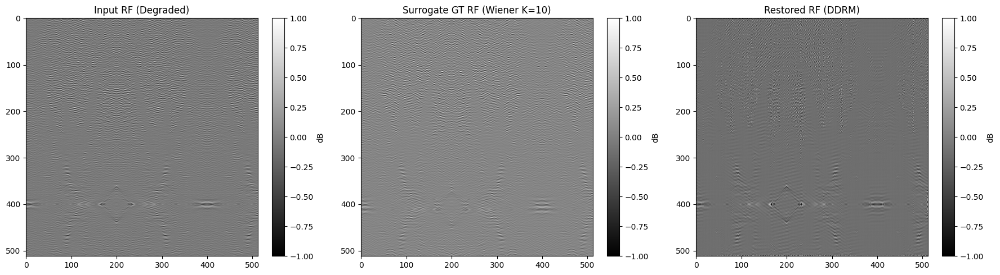

In [24]:
import numpy as np
import scipy.io
import matplotlib.pyplot as plt

# Normalize to [-1, 1]
def normalize_rf(x):
    x_min, x_max = x.min(), x.max()
    return 2 * ((x - x_min) / (x_max - x_min + 1e-8)) - 1

# Load RF data
degraded = scipy.io.loadmat("vivo/normalized_rf.mat")["rf_degraded"]
gt       = scipy.io.loadmat("vivo/rf_GT_norm_512_scaled.mat")["GT_rf_resized"]
restored = scipy.io.loadmat("vivo/ddrm_refined/restored_ddrm.mat")["rf_restored"]

# Normalize and clip
degraded = np.clip(normalize_rf(degraded), -1.0, 1.0)
gt       = np.clip(normalize_rf(gt),       -1.0, 1.0)
restored = np.clip(normalize_rf(restored), -1.0, 1.0)

# Log-compress
def log_compress(rf, eps=1e-6):
    return 20 * np.log10(np.abs(rf) + eps)

#degraded_log = log_compress(degraded)
#gt_log       = log_compress(gt)
#restored_log = log_compress(restored)

# Shared color scale
vmin = min(degraded.min(), gt.min(), restored.min())
vmax = max(degraded.max(), gt.max(), restored.max())

# Plot
plt.figure(figsize=(18, 5))

plt.subplot(1, 3, 1)
plt.imshow(degraded, cmap='gray', aspect='auto', vmin=vmin, vmax=vmax)
plt.title("Input RF (Degraded)")
plt.colorbar(label='dB')

plt.subplot(1, 3, 2)
plt.imshow(gt, cmap='gray', aspect='auto', vmin=vmin, vmax=vmax)
plt.title("Surrogate GT RF (Wiener K=10)")
plt.colorbar(label='dB')

plt.subplot(1, 3, 3)
plt.imshow(restored, cmap='gray', aspect='auto', vmin=vmin, vmax=vmax)
plt.title("Restored RF (DDRM)")
plt.colorbar(label='dB')

plt.tight_layout()
plt.show()


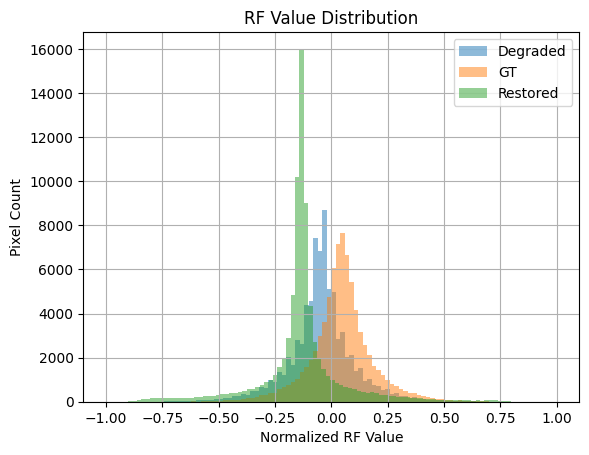

In [29]:
import matplotlib.pyplot as plt

plt.hist(degraded.flatten(), bins=100, alpha=0.5, label="Degraded")
plt.hist(gt.flatten(),       bins=100, alpha=0.5, label="GT")
plt.hist(restored.flatten(), bins=100, alpha=0.5, label="Restored")

plt.legend()
plt.title("RF Value Distribution")
plt.xlabel("Normalized RF Value")
plt.ylabel("Pixel Count")
plt.grid(True)
plt.show()


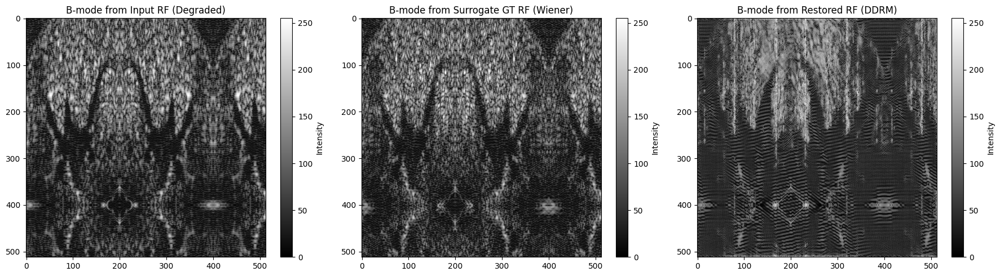

In [30]:
import numpy as np
import scipy.io
import matplotlib.pyplot as plt

# Normalize to [-1, 1]
def normalize_rf(x):
    x_min, x_max = x.min(), x.max()
    return 2 * ((x - x_min) / (x_max - x_min + 1e-8)) - 1

# Load RF data
degraded = scipy.io.loadmat("vivo/normalized_rf.mat")["rf_degraded"]
gt       = scipy.io.loadmat("vivo/rf_GT_norm_512_scaled.mat")["GT_rf_resized"]
restored = scipy.io.loadmat("vivo/ddrm_refined/restored_ddrm.mat")["rf_restored"]
bmode_vivo = scipy.io.loadmat("exp/datasets/anes_data/vivo/data.mat")["bmode"]

# Normalize and clip
degraded = np.clip(normalize_rf(degraded), -1.0, 1.0)
gt       = np.clip(normalize_rf(gt),       -1.0, 1.0)
restored = np.clip(normalize_rf(restored), -1.0, 1.0)
#bmode_vivo = np.clip(normalize_rf(bmode_vivo), -1.0, 1.0)

# === Convert RF to B-mode ===
def rf_to_matched_bmode(RF, ref_bmode, increase=1e-6):
    env = np.abs(hilbert(RF, axis=0))
    db = 20.0 * np.log10(env + increase)
    db = np.clip(db, a_min=-60, a_max=None)
    db -= db.min()
    db *= 255.0 / db.max()
    ref = ref_bmode[:, :, 0] if ref_bmode.ndim == 3 else ref_bmode
    matched = match_histograms(db, ref, channel_axis=None)
    return np.clip(matched, 0, 255).astype(np.uint8)

def rf_to_bmode(RF, match_to=None):
    env = np.abs(hilbert(RF, axis=0))
    db = 20 * np.log10(env + 1e-6)
    db = np.clip(db, -60, None)
    db -= db.min()
    db *= 255.0 / db.max()
    if match_to is not None:
        db = match_histograms(db, match_to, channel_axis=None)
    return np.clip(db, 0, 255).astype(np.uint8)

bmode_degraded = rf_to_matched_bmode(degraded, bmode_vivo)
bmode_gt = rf_to_matched_bmode(gt, bmode_vivo)
bmode_restored = rf_to_matched_bmode(restored, bmode_vivo)

# === Plot B-mode images ===
plt.figure(figsize=(18, 5))

vmin = min(bmode_degraded.min(), bmode_gt.min(), bmode_restored.min())
vmax = max(bmode_degraded.max(), bmode_gt.max(), bmode_restored.max())


plt.subplot(1, 3, 1)
plt.imshow(bmode_degraded, cmap='gray', aspect='auto', vmin=vmin, vmax=vmax)
plt.title("B-mode from Input RF (Degraded)")
plt.colorbar(label='Intensity')

plt.subplot(1, 3, 2)
plt.imshow(bmode_gt, cmap='gray', aspect='auto', vmin=vmin, vmax=vmax)
plt.title("B-mode from Surrogate GT RF (Wiener)")
plt.colorbar(label='Intensity')

plt.subplot(1, 3, 3)
plt.imshow(bmode_restored, cmap='gray', aspect='auto', vmin=vmin, vmax=vmax)

plt.title("B-mode from Restored RF (DDRM)")
plt.colorbar(label='Intensity')

plt.tight_layout()
plt.show()


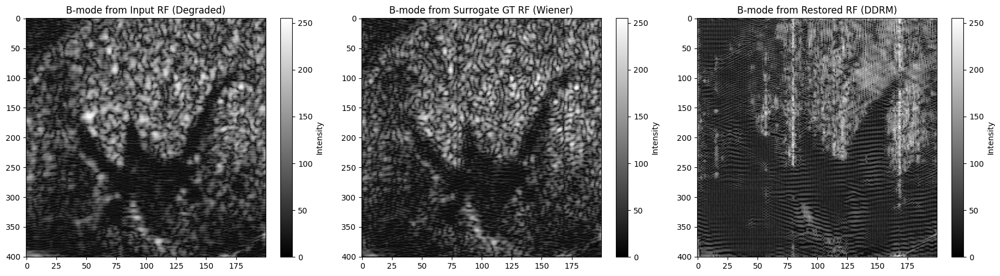

In [31]:


# --- Crop back to original RF size (401×200) ---
degraded = degraded[:401, :200]
gt = gt[:401, :200]
restored = restored[:401, :200]

# Normalize and clip
#degraded = np.clip(normalize_rf(degraded), -1.0, 1.0)
#gt       = np.clip(normalize_rf(gt),       -1.0, 1.0)
#restored = np.clip(normalize_rf(restored), -1.0, 1.0)


def rf_to_bmode(RF, match_to=None):
    env = np.abs(hilbert(RF, axis=0))
    db = 20 * np.log10(env + 1e-6)
    db = np.clip(db, -60, None)
    db -= db.min()
    db *= 255.0 / db.max()
    if match_to is not None:
        db = match_histograms(db, match_to, channel_axis=None)
    return np.clip(db, 0, 255).astype(np.uint8)

bmode_degraded = rf_to_bmode(degraded, bmode_vivo)
bmode_gt = rf_to_bmode(gt, bmode_vivo)
bmode_restored = rf_to_bmode(restored, bmode_vivo)

# === Plot B-mode images ===
plt.figure(figsize=(18, 5))

vmin = min(bmode_degraded.min(), bmode_gt.min(), bmode_restored.min())
vmax = max(bmode_degraded.max(), bmode_gt.max(), bmode_restored.max())


plt.subplot(1, 3, 1)
plt.imshow(bmode_degraded, cmap='gray', aspect='auto', vmin=vmin, vmax=vmax)
plt.title("B-mode from Input RF (Degraded)")
plt.colorbar(label='Intensity')

plt.subplot(1, 3, 2)
plt.imshow(bmode_gt, cmap='gray', aspect='auto', vmin=vmin, vmax=vmax)
plt.title("B-mode from Surrogate GT RF (Wiener)")
plt.colorbar(label='Intensity')

plt.subplot(1, 3, 3)
plt.imshow(bmode_restored, cmap='gray', aspect='auto', vmin=vmin, vmax=vmax)

plt.title("B-mode from Restored RF (DDRM)")
plt.colorbar(label='Intensity')

plt.tight_layout()
plt.show()


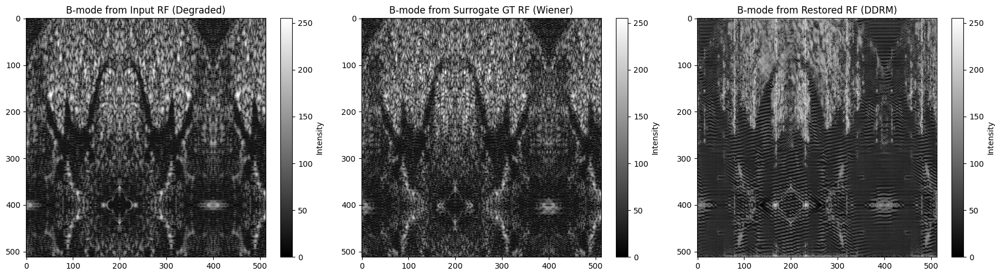

In [38]:
import numpy as np
import scipy.io
import matplotlib.pyplot as plt

# Normalize to [-1, 1]
def normalize_rf(x):
    x_min, x_max = x.min(), x.max()
    return 2 * ((x - x_min) / (x_max - x_min + 1e-8)) - 1

# Load RF data
degraded = scipy.io.loadmat("vivo/normalized_rf.mat")["rf_degraded"]
gt       = scipy.io.loadmat("vivo/rf_GT_norm_512_scaled.mat")["GT_rf_resized"]
restored = scipy.io.loadmat("vivo/ddrm_refined/restored_ddrm.mat")["rf_restored"]
bmode_vivo = scipy.io.loadmat("exp/datasets/anes_data/vivo/data.mat")["bmode"]

# Normalize and clip
degraded = np.clip(normalize_rf(degraded), -1.0, 1.0)
gt       = np.clip(normalize_rf(gt),       -1.0, 1.0)
restored = np.clip(normalize_rf(restored), -1.0, 1.0)
#bmode_vivo = np.clip(normalize_rf(bmode_vivo), -1.0, 1.0)

# === Convert RF to B-mode ===
def rf_to_matched_bmode(RF, ref_bmode, increase=1e-6):
    env = np.abs(hilbert(RF, axis=0))
    db = 20.0 * np.log10(env + increase)
    db = np.clip(db, a_min=-60, a_max=None)
    db -= db.min()
    db *= 255.0 / db.max()
    ref = ref_bmode[:, :, 0] if ref_bmode.ndim == 3 else ref_bmode
    matched = match_histograms(db, ref, channel_axis=None)
    return np.clip(matched, 0, 255).astype(np.uint8)


bmode_degraded = rf_to_matched_bmode(degraded, bmode_vivo)
bmode_gt = rf_to_matched_bmode(gt, bmode_vivo)
bmode_restored = rf_to_matched_bmode(restored, bmode_vivo)

# === Plot B-mode images ===
plt.figure(figsize=(18, 5))

vmin = min(bmode_degraded.min(), bmode_gt.min(), bmode_restored.min())
vmax = max(bmode_degraded.max(), bmode_gt.max(), bmode_restored.max())


plt.subplot(1, 3, 1)
plt.imshow(bmode_degraded, cmap='gray', aspect='auto', vmin=vmin, vmax=vmax)
plt.title("B-mode from Input RF (Degraded)")
plt.colorbar(label='Intensity')

plt.subplot(1, 3, 2)
plt.imshow(bmode_gt, cmap='gray', aspect='auto', vmin=vmin, vmax=vmax)
plt.title("B-mode from Surrogate GT RF (Wiener)")
plt.colorbar(label='Intensity')

plt.subplot(1, 3, 3)
plt.imshow(bmode_restored, cmap='gray', aspect='auto', vmin=vmin, vmax=vmax)

plt.title("B-mode from Restored RF (DDRM)")
plt.colorbar(label='Intensity')

plt.tight_layout()
plt.show()


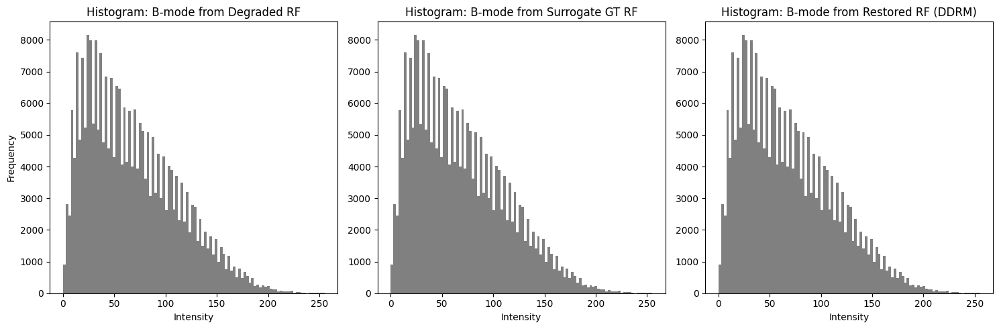

In [39]:
# Plot histograms for B-mode images
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.hist(bmode_degraded.flatten(), bins=100, color='gray')
plt.title("Histogram: B-mode from Degraded RF")
plt.xlabel("Intensity")
plt.ylabel("Frequency")

plt.subplot(1, 3, 2)
plt.hist(bmode_gt.flatten(), bins=100, color='gray')
plt.title("Histogram: B-mode from Surrogate GT RF")
plt.xlabel("Intensity")

plt.subplot(1, 3, 3)
plt.hist(bmode_restored.flatten(), bins=100, color='gray')
plt.title("Histogram: B-mode from Restored RF (DDRM)")
plt.xlabel("Intensity")

plt.tight_layout()
plt.show()


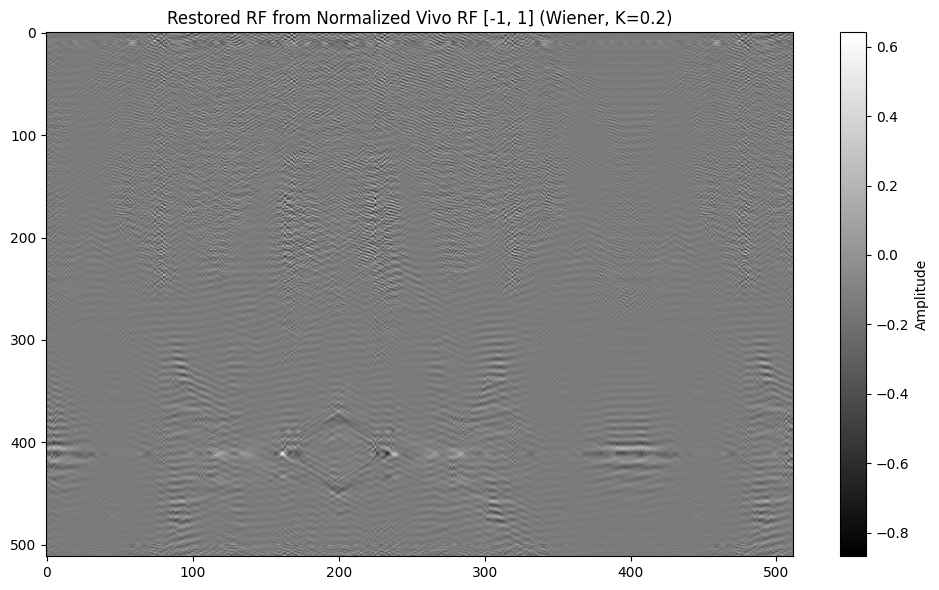

In [40]:
import numpy as np
import matplotlib.pyplot as plt

# Define Wiener deconvolution
def wiener_deconvolution(y: np.ndarray, psf: np.ndarray, K: float = 0.01) -> np.ndarray:
    H, W = y.shape
    Mh, Nh = psf.shape

    # Zero-pad and center PSF
    padded = np.zeros((H, W), dtype=np.float32)
    padded[:Mh, :Nh] = psf
    center = (Mh // 2, Nh // 2)
    shifted = np.roll(np.roll(padded, -center[0], axis=0), -center[1], axis=1)

    # FFTs
    H_fft = np.fft.fft2(shifted)
    Y_fft = np.fft.fft2(y)

    # Wiener filter
    H_conj = np.conj(H_fft)
    H_abs2 = np.abs(H_fft) ** 2
    X_hat = (H_conj / (H_abs2 + K)) * Y_fft

    # Inverse FFT
    x_restored = np.real(np.fft.ifft2(X_hat))
    return x_restored

# Set and use K
K_value = 0.2
restored_ddrm_wiener = wiener_deconvolution(restored, psf_vivo, K=K_value)

# Plot
plt.figure(figsize=(10, 6))
plt.imshow(restored_ddrm_wiener, cmap='gray', aspect='auto')
plt.title(f"Restored RF from Normalized Vivo RF [-1, 1] (Wiener, K={K_value})")
plt.colorbar(label='Amplitude')
plt.tight_layout()
plt.show()


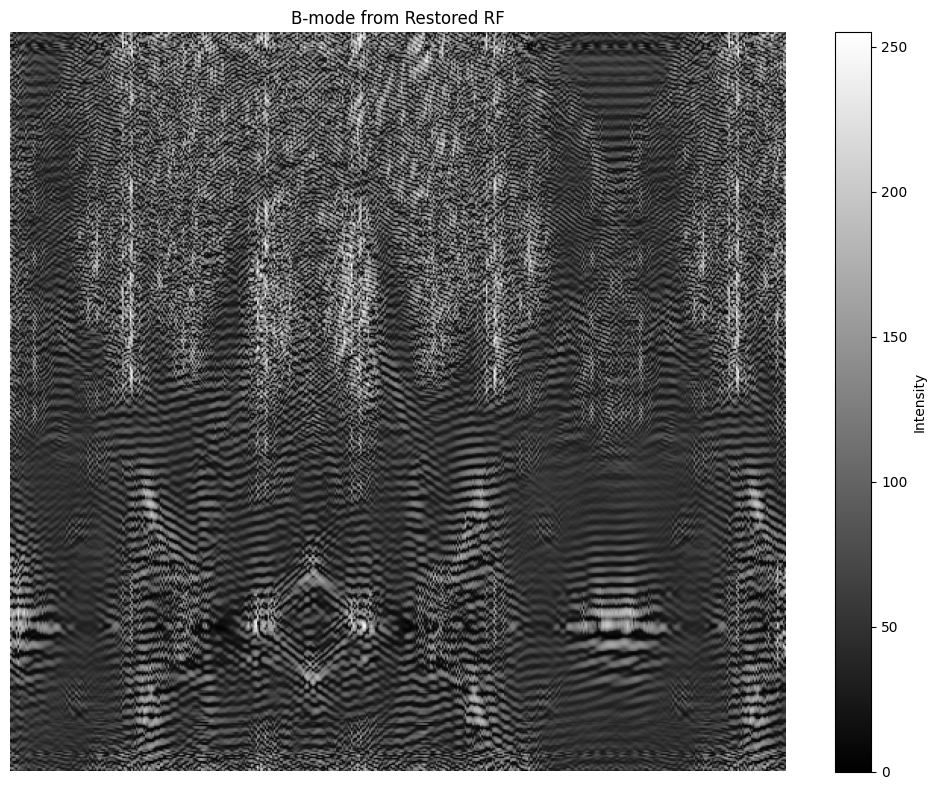

In [41]:
def rf_to_bmode(RF, match_to=None):
    env = np.abs(hilbert(RF, axis=0))
    db = 20 * np.log10(env + 1e-6)
    db = np.clip(db, -60, None)
    db -= db.min()
    db *= 255.0 / db.max()
    if match_to is not None:
        db = match_histograms(db, match_to, channel_axis=None)
    return np.clip(db, 0, 255).astype(np.uint8)
# Apply conversion
bmode_restored_ddrm_wiener = rf_to_bmode(restored_ddrm_wiener, bmode_vivo)

# --- Visualize the B-mode ---
plt.figure(figsize=(10, 8))
plt.imshow(bmode_restored_ddrm_wiener, cmap='gray', aspect='auto')
plt.title("B-mode from Restored RF")
plt.axis('off')
plt.colorbar(label='Intensity')
plt.tight_layout()
plt.show()


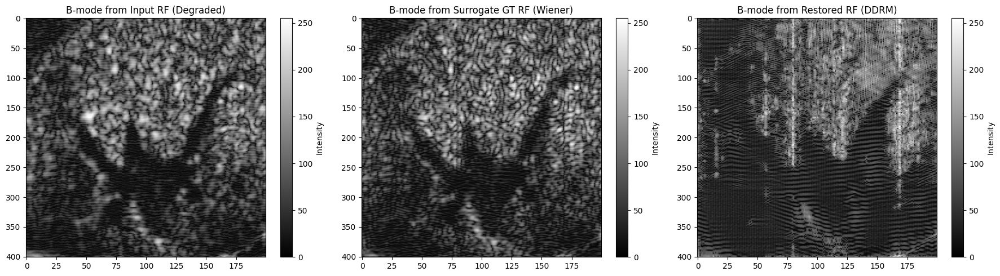

In [42]:
def normalize_rf(rf: np.ndarray, min_val: float = -1.0, max_val: float = 1.0) -> np.ndarray:
    """
    Normalize RF data to a specified range [min_val, max_val].

    Parameters:
        rf (np.ndarray): Input RF data.
        min_val (float): Minimum value of the target range (default: -1.0).
        max_val (float): Maximum value of the target range (default: 1.0).

    Returns:
        np.ndarray: Normalized RF data.
    """
    rf_min, rf_max = rf.min(), rf.max()
    norm = (rf - rf_min) / (rf_max - rf_min + 1e-8)  # avoid division by zero
    scaled = norm * (max_val - min_val) + min_val
    return scaled

# --- Crop back to original RF size (401×200) ---
degraded = degraded[:401, :200]
gt = gt[:401, :200]
restored = restored[:401, :200]

restored = normalize_rf(restored)

def rf_to_bmode(RF, match_to=None):
    env = np.abs(hilbert(RF, axis=0))
    db = 20 * np.log10(env + 1e-6)
    db = np.clip(db, -60, None)
    db -= db.min()
    db *= 255.0 / db.max()
    if match_to is not None:
        db = match_histograms(db, match_to, channel_axis=None)
    return np.clip(db, 0, 255).astype(np.uint8)

bmode_degraded = rf_to_bmode(degraded, bmode_vivo)
bmode_gt = rf_to_bmode(gt, bmode_vivo)
bmode_restored = rf_to_bmode(restored, bmode_vivo)

# === Plot B-mode images ===
plt.figure(figsize=(18, 5))

vmin = min(bmode_degraded.min(), bmode_gt.min(), bmode_restored.min())
vmax = max(bmode_degraded.max(), bmode_gt.max(), bmode_restored.max())


plt.subplot(1, 3, 1)
plt.imshow(bmode_degraded, cmap='gray', aspect='auto', vmin=vmin, vmax=vmax)
plt.title("B-mode from Input RF (Degraded)")
plt.colorbar(label='Intensity')

plt.subplot(1, 3, 2)
plt.imshow(bmode_gt, cmap='gray', aspect='auto', vmin=vmin, vmax=vmax)
plt.title("B-mode from Surrogate GT RF (Wiener)")
plt.colorbar(label='Intensity')

plt.subplot(1, 3, 3)
plt.imshow(bmode_restored, cmap='gray', aspect='auto', vmin=vmin, vmax=vmax)

plt.title("B-mode from Restored RF (DDRM)")
plt.colorbar(label='Intensity')

plt.tight_layout()
plt.show()
